In [1]:
import joblib

import pandas as pd
import numpy as np

# Import SVC from sklearn.svm and accuracy_score from sklearn.metrics
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

import matplotlib.pyplot as plt

import seaborn as sns

from sklearn.model_selection import train_test_split, StratifiedKFold

from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier

from sklearn.pipeline import Pipeline

from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import make_scorer

import random

random_seed = random.seed(42)

from sklearn.preprocessing import LabelEncoder

In [2]:
import configparser
import numpy as np
import keras
import os
import pandas as pd
import shutil

2023-02-20 22:00:32.505381: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
from keras import backend
from keras import optimizers
from keras.models import Model, load_model
from keras.layers import Input, Dense, Dropout, concatenate, Conv2D, BatchNormalization, ReLU, MaxPooling2D, \
    Flatten, AlphaDropout
from keras.callbacks import ModelCheckpoint, CSVLogger, ReduceLROnPlateau, EarlyStopping
from scipy import stats
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, roc_auc_score, accuracy_score, \
    matthews_corrcoef


from sklearn.metrics import accuracy_score, confusion_matrix

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt

In [4]:
import lightgbm as lgb

In [5]:
X_train = pd.read_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/X_train_multiselected.csv', index_col=[0])
y_train = pd.read_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/y_train_SMOV.csv', index_col=[0])
X_test = pd.read_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/X_test_multiselected.csv', index_col=[0])
y_test = pd.read_csv('/Users/karolmccaul/Documents/Uni_of_Bath/research_project/vs_code/resampled_data/y_test.csv', index_col=[0])

train_features = X_train.columns


le = LabelEncoder()
y_train = le.fit_transform(y_train)

y_test = le.fit_transform(y_test)

X_train_val, X_validation, y_train_val, y_validation = train_test_split(X_train, y_train, test_size=0.25)

In [6]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import GridSearchCV
#store data, all in numpy arrays
training_data = {'X_train':X_train_val,'y_train':y_train_val,
                'X_val': X_validation,'y_val':y_validation,
                'X_test': X_test,'y_test':y_test}

In [7]:
lgbm = joblib.load('lgbm_tuned.joblib')

In [ ]:
lgbm.feature_importances_

In [10]:
import shap
import lime

In [11]:
shap_values = shap.TreeExplainer(lgbm).shap_values(training_data['X_train'])

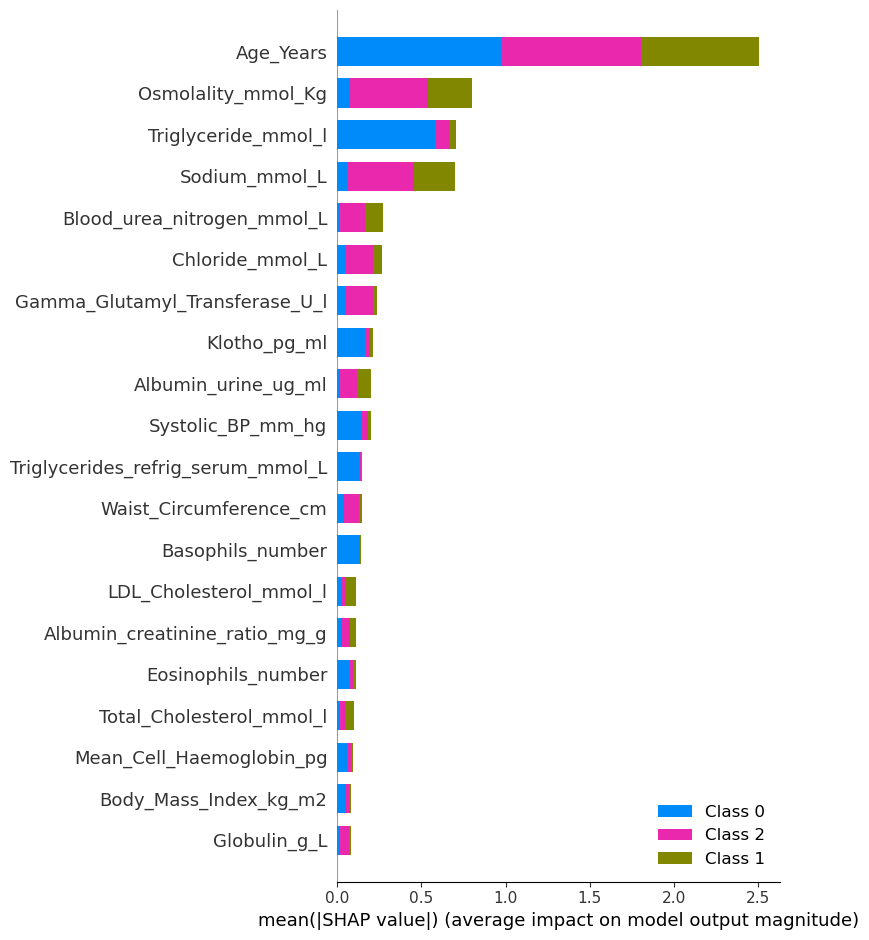

In [13]:
shap.summary_plot(shap_values, training_data['X_train'])

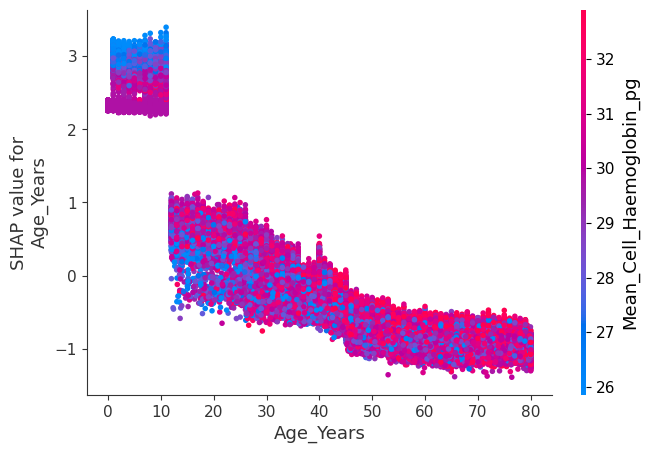

In [16]:
shap.dependence_plot("Age_Years", shap_values[0], training_data['X_train'])

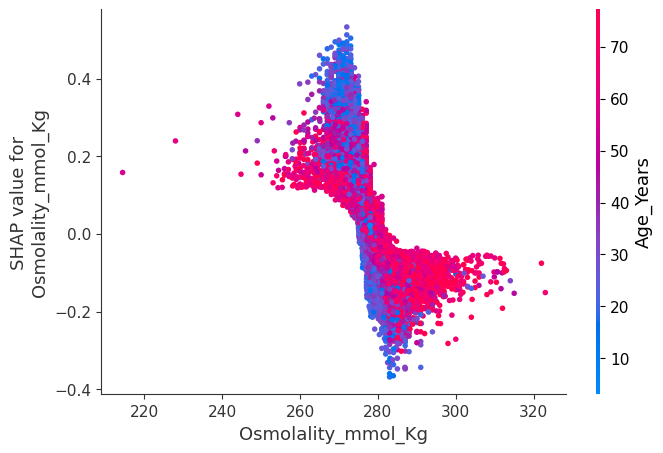

In [18]:
shap.dependence_plot("Osmolality_mmol_Kg", shap_values[0], training_data['X_train'])

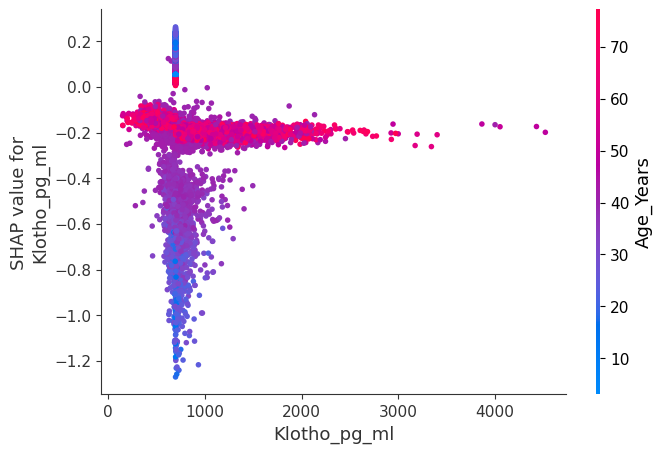

In [20]:
shap.dependence_plot("Klotho_pg_ml", shap_values[0], training_data['X_train'])

In [12]:
explainer = shap.TreeExplainer(lgbm)

In [14]:
chosen_instance = training_data['X_test'].iloc[[2]]
shap_values = explainer.shap_values(chosen_instance)


shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], chosen_instance)

In [15]:
chosen_instance = training_data['X_test'].iloc[[454]]
shap_values = explainer.shap_values(chosen_instance)


shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], chosen_instance)

In [16]:
chosen_instance = training_data['X_test'].iloc[[5679]]
shap_values = explainer.shap_values(chosen_instance)


shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], chosen_instance)

In [17]:
chosen_instance = training_data['X_test'].iloc[[8010]]
shap_values = explainer.shap_values(chosen_instance)


shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], chosen_instance)

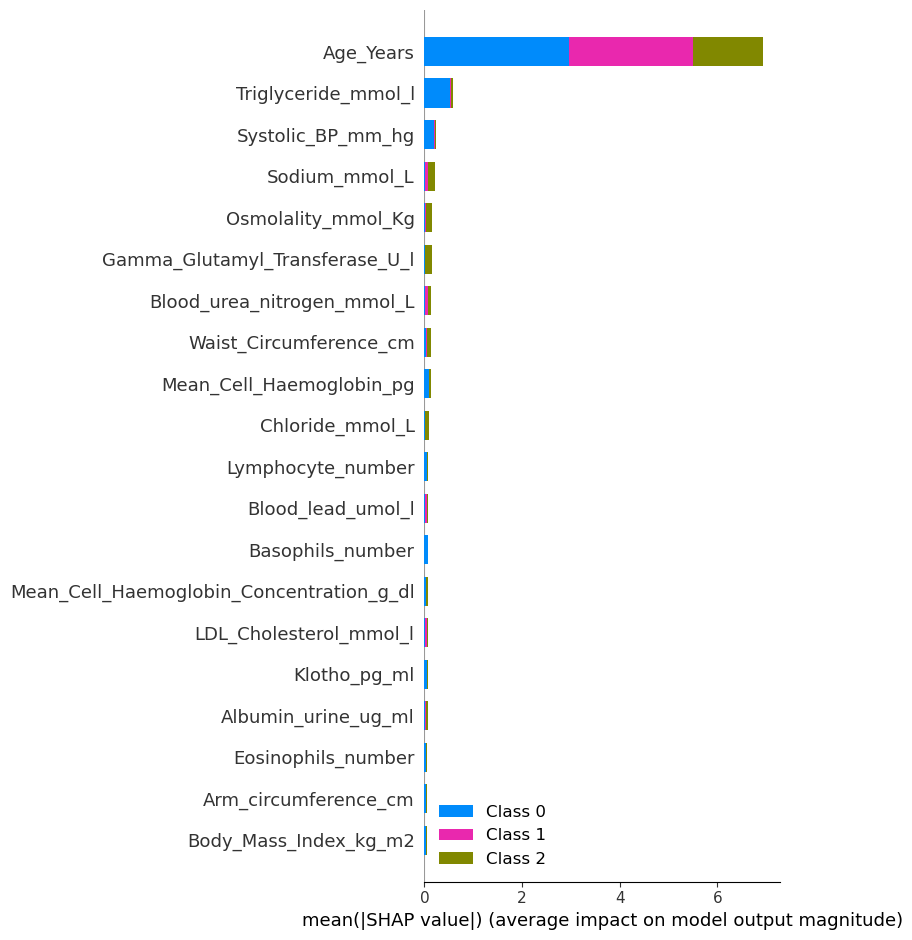

In [19]:
shap.summary_plot(shap_values, training_data['X_test'])

In [23]:
import lime.lime_tabular

In [25]:
predict_fn_tab = lambda x: lgbm.predict_proba(x).astype(float)

lime_explainer = lime.lime_tabular.LimeTabularExplainer(training_data['X_train'].values, 
                                                   feature_names=train_features, 
                                                   class_names=['Normal', 'Prediabetes','Diabetes'], 
                                                   kernel_width=5)


In [45]:
chosen_instance = training_data['X_test'].iloc[[2]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)

In [46]:
chosen_instance = training_data['X_test'].iloc[[454]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)

In [28]:
training_data['y_test'][[454]]

array([2])

In [47]:
chosen_instance = training_data['X_test'].iloc[[5679]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)

In [30]:
training_data['y_test'][[5679]]

array([1])

In [48]:
chosen_instance = training_data['X_test'].iloc[[8010]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)

In [32]:
training_data['y_test'][[8010]]

array([0])

In [49]:
chosen_instance = training_data['X_test'].iloc[[6666]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)

In [34]:
training_data['y_test'][[6666]]

array([1])

In [50]:
chosen_instance = training_data['X_test'].iloc[[5624]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)

In [51]:
chosen_instance = training_data['X_test'].iloc[[6008]].values[0]
exp = lime_explainer.explain_instance(chosen_instance, predict_fn_tab, num_features=10, top_labels=3)
exp.show_in_notebook(show_all=False)